<a href="https://colab.research.google.com/github/dmitrienkoae/Sirius_2021/blob/main/embedding_clusterization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install plotly>=4.0.0
!wget https://github.com/plotly/orca/releases/download/v1.2.1/orca-1.2.1-x86_64.AppImage -O /usr/local/bin/orca
!chmod +x /usr/local/bin/orca
!apt-get install xvfb libgtk2.0-0 libgconf-2-4

In [ ]:
#Basic imports
import numpy as np
import math
import pandas as pd
import scipy

import sklearn 
from sklearn.decomposition import PCA #Principal Component Analysis
from sklearn.manifold import TSNE #T-Distributed Stochastic Neighbor Embedding
from sklearn.cluster import FeatureAgglomeration
from sklearn.cluster import SpectralClustering
from sklearn.linear_model import SGDClassifier
from sklearn.cluster import KMeans #K-Means Clustering

from sklearn.preprocessing import StandardScaler #used for 'Feature Scaling'

#plotly imports
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.io as pio
pio.renderers.default = 'colab' #for colab
#init_notebook_mode(connected=True) #for jupyter

### **Визуализация T-SNE**

In [ ]:
def plot3d_TSNE(X, labels):
    X_test = X.copy()
    X_test["Cluster"] = labels
    #plotX will hold the values we wish to plot
    plotX = pd.DataFrame(np.array(X_test))
    plotX.columns = X_test.columns
    #Set our perplexity
    perplexity = 50
    #T-SNE with one dimension
    #tsne_1d = TSNE(n_components=1, perplexity=perplexity)

    #T-SNE with two dimensions
    #tsne_2d = TSNE(n_components=2, perplexity=perplexity)

    #T-SNE with three dimensions
    tsne_3d = TSNE(n_components=3, perplexity=perplexity)

    #This DataFrame holds a single dimension,built by T-SNE
    #TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

    #This DataFrame contains two dimensions, built by T-SNE
    #TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

    #And this DataFrame contains three dimensions, built by T-SNE
    TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))

    #TCs_1d.columns = ["TC1_1d"]
    #"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
    #And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
    #TCs_2d.columns = ["TC1_2d","TC2_2d"]
    TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]

    plotX = pd.concat([plotX,#TCs_1d,TCs_2d,
                       TCs_3d], axis=1, join='inner')
    #plotX["dummy"] = 0
    clusters = []
    for i in range(10):
         clusters.append(plotX[plotX["Cluster"] == i])
    
    #Instructions for building the 3-D plot
    traces = [go.Scatter3d(
                        x = clusters[i]["TC1_3d"],
                        y = clusters[i]["TC2_3d"],
                        z = clusters[i]["TC3_3d"],
                        mode = "markers",
                        name = "Cluster " + str(i),
                        text = None) for i in range(10)]

    title = "Visualizing Clusters in Three Dimensions Using T-SNE (perplexity=" + str(perplexity) + ")"

    layout = dict(title = title,
                  xaxis= dict(title= 'TC1',ticklen= 5,zeroline= False),
                  yaxis= dict(title= 'TC2',ticklen= 5,zeroline= False)
                )

    fig = dict(data = traces, layout = layout)

    iplot(fig)
    return fig

def plot2d_TSNE(X, labels):
    X_test = X.copy()
    X_test["Cluster"] = labels
    #plotX will hold the values we wish to plot
    plotX = pd.DataFrame(np.array(X_test))
    plotX.columns = X_test.columns
    #Set our perplexity
    perplexity = 50
    #T-SNE with one dimension
    #tsne_1d = TSNE(n_components=1, perplexity=perplexity)

    #T-SNE with two dimensions
    tsne_2d = TSNE(n_components=2, perplexity=perplexity)

    #T-SNE with three dimensions
    #tsne_3d = TSNE(n_components=3, perplexity=perplexity)

    #This DataFrame holds a single dimension,built by T-SNE
    #TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

    #This DataFrame contains two dimensions, built by T-SNE
    TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

    #And this DataFrame contains three dimensions, built by T-SNE
    #TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))
    #TCs_1d.columns = ["TC1_1d"]

    #"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
    #And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
    TCs_2d.columns = ["TC1_2d","TC2_2d"]

    #TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]
    plotX = pd.concat([plotX
                   #,TCs_1d
                   ,TCs_2d
                   #,TCs_3d
                   ], axis=1, join='inner')
    #plotX["dummy"] = 0

    clusters = []
    for i in range(10):
         clusters.append(plotX[plotX["Cluster"] == i])

    
    #Instructions for building the 2-D plot

    #trace1 is for 'Cluster 0'
    traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        name = "Cluster " + str(i),
                        text = None) for i in range(10)]

    title = "Visualizing Clusters in Two Dimensions Using T-SNE (perplexity=" + str(perplexity) + ")"

    layout = dict(title = title,
                  xaxis= dict(title= 'TC1',ticklen= 5,zeroline= False),
                  yaxis= dict(title= 'TC2',ticklen= 5,zeroline= False)
                )

    fig = dict(data = traces, layout = layout)

    iplot(fig)
    return fig

In [ ]:
import sklearn.metrics.cluster as smc
import sklearn.metrics as sm

def benchmark(pred_labels, features = None, true_labels=None, only_external = False):
  if true_labels is not None:
      print("External Score:")
      a = smc.adjusted_mutual_info_score(true_labels, pred_labels)
      b = smc.adjusted_rand_score(true_labels, pred_labels)
      c = smc.fowlkes_mallows_score(true_labels, pred_labels)
      d = smc.normalized_mutual_info_score(true_labels, pred_labels)
      v = sm.v_measure_score(true_labels, pred_labels)
      print("AMI — {}".format(a))
      print("ARI — {}".format(b))
      print("FMI — {}".format(c))
      print("NMI — {}".format(d))
      print("V-measure — {}\n".format(v))
      if only_external:
        return np.array([a, b, c, d, v])
  print("Internal Score:")
  chs = smc.calinski_harabasz_score(features, pred_labels)
  sc = smc.silhouette_score(features, pred_labels)
  dbs = smc.davies_bouldin_score(features, pred_labels)
  print("Calinski_score — {}".format(chs))
  print("davies_bouldin_score — {}".format(dbs))
  print("silhouette_score — {}".format(sc))
  if true_labels is not None:
    return np.array([a, b, c, d, v, chs, dbs, sc])
  else:
    return np.array([ chs, dbs, sc])

**Загружаем данные**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def unpickle(file):
  import pickle
  with open(file, 'rb') as fo:
    dict = pickle.load(fo, encoding='latin1')
  return dict

#Get embeddings
test_embd = np.load('/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_test_embeddings.npy')
train_embd = np.load("/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_train_embeddings.npy")

all_embd = np.vstack((train_embd, test_embd))
print(all_embd.shape)

#Get Train_test dataset
path = '/content/drive/MyDrive/Colab Notebooks/sirius/cifar-10-python/cifar-10-batches-py/'
test_dic = unpickle(path+'test_batch')
tr1_dic = unpickle(path+'data_batch_1')
tr2_dic = unpickle(path+'data_batch_2')
tr3_dic = unpickle(path+'data_batch_3')
tr4_dic = unpickle(path+'data_batch_4')
tr5_dic = unpickle(path+'data_batch_5')


(60000, 512)


In [ ]:
iX_test = test_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")

iX_tr1 = tr1_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")
iX_tr2 = tr2_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")
iX_tr3 = tr3_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")
iX_tr4 = tr4_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")
iX_tr5 = tr5_dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")

iX_train = np.vstack((iX_tr1, iX_tr2, iX_tr3, iX_tr4, iX_tr5))
print(iX_train.shape)

(50000, 32, 32, 3)


In [ ]:
y_test= test_dic['labels']
y_tr1 = np.array(tr1_dic['labels'])
y_tr2 = np.array(tr2_dic['labels'])
y_tr3 = np.array(tr3_dic['labels'])
y_tr4 = np.array(tr4_dic['labels'])
y_tr5 = np.array(tr5_dic['labels'])

y_train = np.hstack((y_tr1, y_tr2, y_tr3, y_tr4, y_tr5))
y_all = np.hstack((y_train, y_test))

In [ ]:
test = np.load('/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_test_embeddings.npy')
train = np.load("/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_train_embeddings.npy")

X_test = test.copy()
X_train = train.copy()
X_test = sklearn.preprocessing.normalize(X_test, norm='l2', axis=1, copy=True, return_norm=False)
X_train = sklearn.preprocessing.normalize(X_train, norm='l2', axis=1, copy=True, return_norm=False)
X_test = pd.DataFrame(X_test)
X_train = pd.DataFrame(X_train)

## **K-means on images**

https://github.com/partha2409/CIFAR10_K-means_clustering/blob/master/kmeans.py

In [ ]:
import pickle
import numpy as np
import os
import matplotlib.pyplot as plt


def unpickle(file):
    with open(file, 'rb') as f:
        data = pickle.load(f, encoding="latin1")
    return data


def classification_accuracy(prediction, ground_truth):
    ground_truth = ground_truth[:prediction.shape[0]]
    n_images = prediction.shape[0]
    x = prediction - ground_truth
    n_wrong_predictions = np.count_nonzero(x)
    accuracy = (n_images - n_wrong_predictions) / n_images

    return accuracy*100


def load_training_data(dataset_path):
    train_images = np.zeros([50000, 3072])
    train_labels = np.zeros([50000])

    start = 0
    n_images_in_a_file = 10000
    for i in range(1, 6):
        path = os.path.join(dataset_path, "data_batch_{}".format(i))
        data_dict = unpickle(path)
        train_images[start: start + n_images_in_a_file, :] = data_dict["data"]
        train_labels[start: start + n_images_in_a_file] = data_dict["labels"]
        start += n_images_in_a_file

    return np.asarray(train_images, dtype=np.int), np.asarray(train_labels, dtype=np.int)


def load_test_data(dataset_path):

    path = os.path.join(dataset_path, "test_batch")
    datadict = unpickle(path)
    test_images = datadict["data"]
    test_labels = datadict["labels"]
    return np.asarray(test_images, dtype=np.int), np.asarray(test_labels, dtype=np.int)


def cluster_indices(clust_num, labels_array):
    return np.where(labels_array == clust_num)[0]

In [ ]:
benchmark_ikmeans = benchmark(pred_labels=predicted_labels, true_labels=y_test, only_external=True )

External Score:
AMI — 0.06148008836505305
ARI — 0.033369509985815476
FMI — 0.17378277486836283
NMI — 0.0625381854387684
V-measure — 0.0625381854387684



## **K-Means**
https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

In [ ]:
from sklearn.cluster import KMeans #K-Means Clustering

kmeans = KMeans(n_clusters=10)
kmeans.fit(X_train)
clusters_kmeans = kmeans.predict(X_test)
bencmark_kmeans = benchmark(clusters_kmeans, X_test, y_test)

External Score:
AMI — 0.715138664444865
ARI — 0.6281919697920609
FMI — 0.6673625273173446
NMI — 0.7156450587754187
V-measure — 0.7156450587754186

Internal Score:
Calinski_score — 555.8216693602856
davies_bouldin_score — 2.661590773507945
silhouette_score — 0.10997519294579355


In [ ]:

X_test = test.copy()
X_train = train.copy()
X_test = sklearn.preprocessing.normalize(X_test, norm='l2', axis=1, copy=True, return_norm=False)
X_train = sklearn.preprocessing.normalize(X_train, norm='l2', axis=1, copy=True, return_norm=False)
X_test = pd.DataFrame(X_test)
X_train = pd.DataFrame(X_train)

X_test["Cluster"] = clusters_kmeans
#plotX will hold the values we wish to plot
plotX = pd.DataFrame(np.array(X_test))
plotX.columns = X_test.columns
#Set our perplexity
perplexity = 50
#T-SNE with one dimension
#tsne_1d = TSNE(n_components=1, perplexity=perplexity)

#T-SNE with two dimensions
tsne_2d = TSNE(n_components=2, perplexity=perplexity)

#T-SNE with three dimensions
#tsne_3d = TSNE(n_components=3, perplexity=perplexity)

#This DataFrame holds a single dimension,built by T-SNE
#TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#This DataFrame contains two dimensions, built by T-SNE
TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#And this DataFrame contains three dimensions, built by T-SNE
#TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))
#TCs_1d.columns = ["TC1_1d"]

#"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
#And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
TCs_2d.columns = ["TC1_2d","TC2_2d"]

#TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]
plotX = pd.concat([plotX
                #,TCs_1d
                ,TCs_2d
                #,TCs_3d
                ], axis=1, join='inner')
#plotX["dummy"] = 0

clusters = []
for i in range(10):
      clusters.append(plotX[plotX["Cluster"] == i])

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
fig = go.Figure()
title = "K-means"

layout = go.Layout(
    title=title,
    plot_bgcolor="#FFF",  # Sets background color to white
    xaxis=dict(
        title="",
        linecolor="#BCCCDC",  # Sets color of X-axis line
        showgrid=False  # Removes X-axis grid lines
    ),
    yaxis=dict(
        title="",  
        linecolor="#BCCCDC",  # Sets color of Y-axis line
        showgrid=False,  # Removes Y-axis grid lines    
    )
)

traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        opacity = .7,
                        name = "Cluster " + str(i),
                        marker = dict(size = 4.5),
                     ) for i in range(10)]

fig = go.Figure(
          data=traces ,
                    layout=layout, 
)   

layout = dict(title = title )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(showlegend=False)

fig.show()

In [ ]:

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
fig = go.Figure()
title = "K-means"

layout = go.Layout(
    title=title,
    plot_bgcolor="#FFF",  # Sets background color to white
    xaxis=dict(
        title="",
        linecolor="#BCCCDC",  # Sets color of X-axis line
        showgrid=False  # Removes X-axis grid lines
    ),
    yaxis=dict(
        title="",  
        linecolor="#BCCCDC",  # Sets color of Y-axis line
        showgrid=False,  # Removes Y-axis grid lines    
    )
)

traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        opacity = .7,
                        name = "Cluster " + str(i),
                        marker = dict(size = 4.5),
                     ) for i in range(10)]

fig = go.Figure(
          data=traces ,
                    layout=layout, 
)   

layout = dict(title = title )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(showlegend=False)

fig.show()

In [ ]:
fig.write_image("/content/drive/MyDrive/iin_images/kmeans.svg")

In [ ]:
fig = plot2d_TSNE(X_test, clusters_kmeans)

## **MeanShift**

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MeanShift.html#sklearn.cluster.MeanShift

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
bandwidth = estimate_bandwidth(train, quantile=0.2, n_samples=500)
mshift = MeanShift().fit(train)
clusters_mshift = mshift.labels_ 
bencmark_mshift = benchmark(clusters_mshift, X_test)
fig = plot2d_TSNE(X_test, clusters_mshift)

## **GaussianMixture**
https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html?highlight=mixture#sklearn.mixture.GaussianMixture

In [ ]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=10)
gmm.fit(X_train)
clusters_gmm = gmm.predict(X_test)
benchmark_gmm = benchmark(cluster_gmm, X_test)
fig = plot2d_TSNE(X_test, clusters_gmm)

## **Spectral Clustering**
https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html

In [ ]:
fig = plot2d_TSNE(X_test, clusters_sp)

## **SOM**

https://pypi.org/project/sklearn-som/


In [ ]:
!pip install sklearn_som

In [ ]:
from sklearn_som.som import SOM
som = SOM(m=10, n=1, dim=512)
som.fit(train)
predictions = som.predict(test)
benchmark_som = benchmark(predictions, test, y_test)

External Score:
AMI — 0.6293207126195675
ARI — 0.5015913664426365
FMI — 0.5532330847073714
NMI — 0.6299788023270101
V-measure — 0.6299788023270101

Internal Score:
Calinski_score — 494.13030506245195
davies_bouldin_score — 3.4417956578099114
silhouette_score — 0.07864034917062218


In [ ]:
fig = plot2d_TSNE(pd.DataFrame(test), predictions)

## **Autoencoder**

https://www.analyticsvidhya.com/blog/2018/05/essentials-of-deep-learning-trudging-into-unsupervised-deep-learning/

In [ ]:
from keras import callbacks
from keras.models import Model
from keras.optimizers import SGD
from keras.layers import Dense, Input
from keras.initializers import VarianceScaling
from keras.engine.topology import Layer, InputSpec

# this is our input placeholder
input = Input(shape=(512,))

# "encoded" is the encoded representation of the input
encoded = Dense(256, activation='relu')(input)
encoded = Dense(256, activation='relu')(encoded)
encoded = Dense(512, activation='relu')(encoded)
encoded = Dense(10, activation='sigmoid')(encoded)

# "decoded" is the lossy reconstruction of the input
decoded = Dense(512, activation='relu')(encoded)
decoded = Dense(256, activation='relu')(decoded)
decoded = Dense(256, activation='relu')(decoded)
decoded = Dense(512)(decoded)

# this model maps an input to its reconstruction
autoencoder = Model(input, decoded)

In [ ]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 512)]             0         
_________________________________________________________________
dense (Dense)                (None, 256)               131328    
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
dense_3 (Dense)              (None, 10)                5130      
_________________________________________________________________
dense_4 (Dense)              (None, 512)               5632      
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328

In [ ]:
#  this model maps an input to its encoded representation
encoder = Model(input, encoded)
autoencoder.compile(optimizer='adam', loss='mse')

In [ ]:
X_test.shape

(10000, 512)

In [ ]:
test = np.load('/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_test_embeddings.npy')
train = np.load("/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_train_embeddings.npy")

X_test = test.copy()
X_train = train.copy()

X_test = sklearn.preprocessing.normalize(X_test, norm='l2', axis=1, copy=True, return_norm=False)
X_train = sklearn.preprocessing.normalize(X_train, norm='l2', axis=1, copy=True, return_norm=False)
X_test = pd.DataFrame(X_test)
X_train = pd.DataFrame(X_train)


In [ ]:
train_history = autoencoder.fit(X_train, X_train, epochs=100, batch_size=2048, validation_data=(X_test, X_test))

Epoch 1/100
25/25 [==============================] - 19s 209ms/step - loss: 0.0017 - val_loss: 5.3600e-04
Epoch 2/100
25/25 [==============================] - 5s 189ms/step - loss: 5.1308e-04 - val_loss: 4.7961e-04
Epoch 3/100
25/25 [==============================] - 5s 184ms/step - loss: 4.7721e-04 - val_loss: 4.7497e-04
Epoch 4/100
25/25 [==============================] - 5s 186ms/step - loss: 4.7536e-04 - val_loss: 4.7448e-04
Epoch 5/100
25/25 [==============================] - 5s 182ms/step - loss: 4.7447e-04 - val_loss: 4.7398e-04
Epoch 6/100
25/25 [==============================] - 5s 185ms/step - loss: 4.7311e-04 - val_loss: 4.7331e-04
Epoch 7/100
25/25 [==============================] - 5s 185ms/step - loss: 4.7341e-04 - val_loss: 4.7103e-04
Epoch 8/100
25/25 [==============================] - 5s 187ms/step - loss: 4.6891e-04 - val_loss: 4.5965e-04
Epoch 9/100
25/25 [==============================] - 5s 187ms/step - loss: 4.5194e-04 - val_loss: 4.2262e-04
Epoch 10/100
25/25 [==

In [ ]:
pred_auto_train = encoder.predict(X_train)
pred_auto = encoder.predict(X_test)
km = KMeans(n_jobs=-1, n_clusters=10, n_init=20)
km.fit(pred_auto_train)
pred_enc = km.predict(pred_auto)
benchmark_autoencoder = benchmark(pred_enc, X_test, y_test)

External Score:
AMI — 0.7391859640440777
ARI — 0.658986233757395
FMI — 0.6941551009350548
NMI — 0.7396481238597163
V-measure — 0.7396481238597163

Internal Score:
Calinski_score — 546.188358028896
davies_bouldin_score — 2.7509974124080143
silhouette_score — 0.10478289794530869


In [ ]:

X_test["Cluster"] = pred_enc
#plotX will hold the values we wish to plot
plotX = pd.DataFrame(np.array(X_test))
plotX.columns = X_test.columns
#Set our perplexity
perplexity = 50
#T-SNE with one dimension
#tsne_1d = TSNE(n_components=1, perplexity=perplexity)

#T-SNE with two dimensions
tsne_2d = TSNE(n_components=2, perplexity=perplexity)

#T-SNE with three dimensions
#tsne_3d = TSNE(n_components=3, perplexity=perplexity)

#This DataFrame holds a single dimension,built by T-SNE
#TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#This DataFrame contains two dimensions, built by T-SNE
TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#And this DataFrame contains three dimensions, built by T-SNE
#TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))
#TCs_1d.columns = ["TC1_1d"]

#"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
#And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
TCs_2d.columns = ["TC1_2d","TC2_2d"]

#TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]
plotX = pd.concat([plotX
                #,TCs_1d
                ,TCs_2d
                #,TCs_3d
                ], axis=1, join='inner')
#plotX["dummy"] = 0

clusters = []
for i in range(10):
      clusters.append(plotX[plotX["Cluster"] == i])


#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
fig = go.Figure()
title = ""

layout = go.Layout(
    title=title,
    plot_bgcolor="#FFF",  # Sets background color to white
    xaxis=dict(
        title="",
        linecolor="#BCCCDC",  # Sets color of X-axis line
        showgrid=False  # Removes X-axis grid lines
    ),
    yaxis=dict(
        title="",  
        linecolor="#BCCCDC",  # Sets color of Y-axis line
        showgrid=False,  # Removes Y-axis grid lines    
    )
)

traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        opacity = .7,
                        name = "Cluster " + str(i),
                        marker = dict(size = 4.5),
                     ) for i in range(10)]

fig = go.Figure(
          data=traces ,
                    layout=layout, 
)   

layout = dict(title = title )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(showlegend=False)

fig.show()

In [ ]:

#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
fig = go.Figure()
title = ""

layout = go.Layout(
    title=title,
    plot_bgcolor="#FFF",  # Sets background color to white
    xaxis=dict(
        title="",
        linecolor="#BCCCDC",  # Sets color of X-axis line
        showgrid=False  # Removes X-axis grid lines
    ),
    yaxis=dict(
        title="",  
        linecolor="#BCCCDC",  # Sets color of Y-axis line
        showgrid=False,  # Removes Y-axis grid lines    
    )
)

traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        opacity = .7,
                        name = "Cluster " + str(i),
                        marker = dict(size = 4.5),
                     ) for i in range(10)]

fig = go.Figure(
          data=traces ,
                    layout=layout, 
)   

layout = dict(title = title )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(showlegend=False)

fig.show()

In [ ]:
fig.write_image("/content/drive/MyDrive/iin_images/auto.png")

In [ ]:
fig = plot2d_TSNE(X_test, pred_enc)

In [ ]:
fig1 = plot3d_TSNE(X_test, pred_enc)

## **DEC model**

https://arxiv.org/pdf/1511.06335.pdf

https://www.analyticsvidhya.com/blog/2018/05/essentials-of-deep-learning-trudging-into-unsupervised-deep-learning/

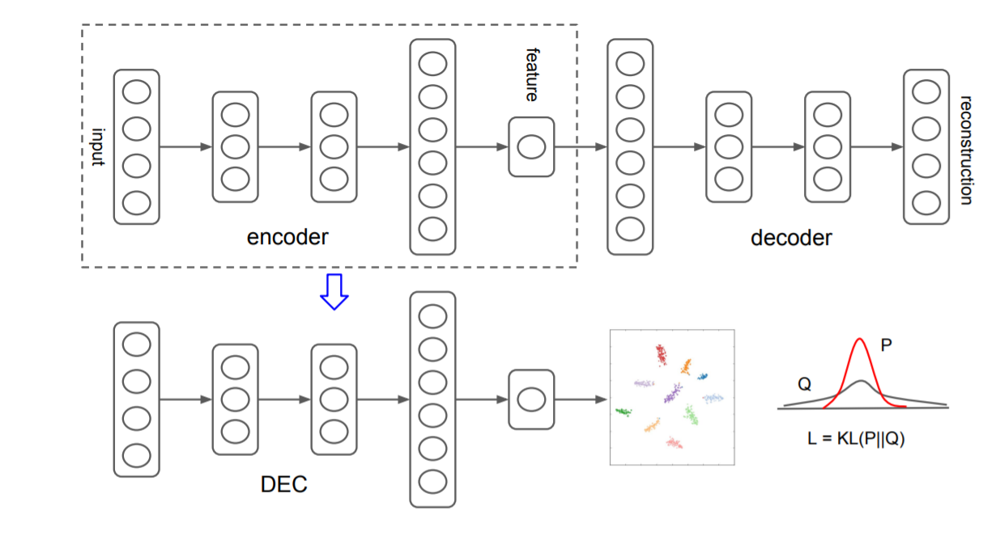

In [ ]:
!git clone https://github.com/XifengGuo/DEC-keras
!cd DEC-keras

Cloning into 'DEC-keras'...
remote: Enumerating objects: 60, done.
remote: Total 60 (delta 0), reused 0 (delta 0), pack-reused 60
Unpacking objects: 100% (60/60), done.


In [ ]:
!pip install imageio

In [ ]:
!pip install metrics

     |████████████████████████████████| 841 kB 5.2 MB/s 
  Created wheel for metrics: filename=metrics-0.3.3-py2.py3-none-any.whl size=17814 sha256=c01fcf6c59019c41604b63bf0e04ab8eea3cea47f8fb4a10937f657d17fc39e3
  Stored in directory: /root/.cache/pip/wheels/54/98/67/aa136e6754d2105b31e0f43c72a208c94d812c9e1d9f18d971
  Created wheel for pathspec: filename=pathspec-0.5.5-py3-none-any.whl size=24234 sha256=25e66178137bd4bbcc4318a109f6231dd240ae526526287ff03a5d5ca9b06c5b
  Stored in directory: /root/.cache/pip/wheels/09/97/ce/98234adaab0cf5b2c3a1b6610ada24e6f7ab3675fff4e0b8b2
Successfully built metrics pathspec
  Attempting uninstall: Pygments
    Found existing installation: Pygments 2.6.1
    Uninstalling Pygments-2.6.1:
      Successfully uninstalled Pygments-2.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-pygments 0.1.2 requires pygments<3,>=

In [ ]:
%pylab inline
import os
import keras
import metrics
import numpy as np
import pandas as pd
import keras.backend as K

from time import time

from keras import callbacks
from keras.models import Model
from keras.optimizers import SGD
from keras.layers import Dense, Input
from keras.initializers import VarianceScaling
from keras.engine.topology import Layer, InputSpec

from imageio import imread
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, normalized_mutual_info_score

# To stop potential randomness
seed = 128
rng = np.random.RandomState(seed)

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning:

pylab import has clobbered these variables: ['test', 'title', 'plot']
`%matplotlib` prevents importing * from pylab and numpy



In [ ]:
"""
Keras implementation for Deep Embedded Clustering (DEC) algorithm:

Original Author:
    Xifeng Guo. 2017.1.30
"""


def autoencoder(dims, act='relu', init='glorot_uniform'):
    """
    Fully connected auto-encoder model, symmetric.
    Arguments:
        dims: list of number of units in each layer of encoder. dims[0] is input dim, dims[-1] is units in hidden layer.
            The decoder is symmetric with encoder. So number of layers of the auto-encoder is 2*len(dims)-1
        act: activation, not applied to Input, Hidden and Output layers
    return:
        (ae_model, encoder_model), Model of autoencoder and model of encoder
    """
    n_stacks = len(dims) - 1
    # input
    x = Input(shape=(dims[0],), name='input')
    h = x

    # internal layers in encoder
    for i in range(n_stacks-1):
        h = Dense(dims[i + 1], activation=act, kernel_initializer=init, name='encoder_%d' % i)(h)

    # hidden layer
    h = Dense(dims[-1], kernel_initializer=init, name='encoder_%d' % (n_stacks - 1))(h)  # hidden layer, features are extracted from here

    y = h
    # internal layers in decoder
    for i in range(n_stacks-1, 0, -1):
        y = Dense(dims[i], activation=act, kernel_initializer=init, name='decoder_%d' % i)(y)

    # output
    y = Dense(dims[0], kernel_initializer=init, name='decoder_0')(y)

    return Model(inputs=x, outputs=y, name='AE'), Model(inputs=x, outputs=h, name='encoder')


class ClusteringLayer(Layer):
    """
    Clustering layer converts input sample (feature) to soft label, i.e. a vector that represents the probability of the
    sample belonging to each cluster. The probability is calculated with student's t-distribution.

    # Example
    ```
        model.add(ClusteringLayer(n_clusters=10))
    ```
    # Arguments
        n_clusters: number of clusters.
        weights: list of Numpy array with shape `(n_clusters, n_features)` witch represents the initial cluster centers.
        alpha: parameter in Student's t-distribution. Default to 1.0.
    # Input shape
        2D tensor with shape: `(n_samples, n_features)`.
    # Output shape
        2D tensor with shape: `(n_samples, n_clusters)`.
    """

    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        if 'input_shape' not in kwargs and 'input_dim' in kwargs:
            kwargs['input_shape'] = (kwargs.pop('input_dim'),)
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights
        self.input_spec = InputSpec(ndim=2)

    def build(self, input_shape):
        assert len(input_shape) == 2
        input_dim = input_shape[1]
        self.input_spec = InputSpec(dtype=K.floatx(), shape=(None, input_dim))
        self.clusters = self.add_weight(shape=(self.n_clusters, input_dim), initializer='glorot_uniform', name='clusters')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        self.built = True

    def call(self, inputs, **kwargs):
        """ student t-distribution, as same as used in t-SNE algorithm.
                 q_ij = 1/(1+dist(x_i, u_j)^2), then normalize it.
        Arguments:
            inputs: the variable containing data, shape=(n_samples, n_features)
        Return:
            q: student's t-distribution, or soft labels for each sample. shape=(n_samples, n_clusters)
        """
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], self.n_clusters

    def get_config(self):
        config = {'n_clusters': self.n_clusters}
        base_config = super(ClusteringLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


class DEC(object):
    def __init__(self,
                 dims,
                 n_clusters=10,
                 alpha=1.0,
                 init='glorot_uniform'):

        super(DEC, self).__init__()

        self.dims = dims
        self.input_dim = dims[0]
        self.n_stacks = len(self.dims) - 1

        self.n_clusters = n_clusters
        self.alpha = alpha
        self.autoencoder, self.encoder = autoencoder(self.dims, init=init)

        # prepare DEC model
        clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')(self.encoder.output)
        self.model = Model(inputs=self.encoder.input, outputs=clustering_layer)

    def pretrain(self, x, y=None, optimizer='adam', epochs=200, batch_size=256, save_dir='results/temp'):
        print('...Pretraining...')
        self.autoencoder.compile(optimizer=optimizer, loss='mse')

        csv_logger = callbacks.CSVLogger(save_dir + '/pretrain_log.csv')
        cb = [csv_logger]
        if y is not None:
            class PrintACC(callbacks.Callback):
                def __init__(self, x, y):
                    self.x = x
                    self.y = y
                    super(PrintACC, self).__init__()

                def on_epoch_end(self, epoch, logs=None):
                    if epoch % int(epochs/10) != 0:
                        return
                    feature_model = Model(self.model.input,
                                          self.model.get_layer(
                                              'encoder_%d' % (int(len(self.model.layers) / 2) - 1)).output)
                    features = feature_model.predict(self.x)
                    km = KMeans(n_clusters=len(np.unique(self.y)), n_init=20, n_jobs=4)
                    y_pred = km.fit_predict(features)
                    # print()
                    print(' '*8 + '|==>  acc: %.4f,  nmi: %.4f  <==|'
                          % (metrics.acc(self.y, y_pred), metrics.nmi(self.y, y_pred)))

            cb.append(PrintACC(x, y))

        # begin pretraining
        t0 = time()
        self.autoencoder.fit(x, x, batch_size=batch_size, epochs=epochs, callbacks=cb)
        print('Pretraining time: ', time() - t0)
        self.autoencoder.save_weights(save_dir + '/ae_weights.h5')
        print('Pretrained weights are saved to %s/ae_weights.h5' % save_dir)
        self.pretrained = True

    def load_weights(self, weights):  # load weights of DEC model
        self.model.load_weights(weights)

    def extract_features(self, x):
        return self.encoder.predict(x)

    def predict(self, x):  # predict cluster labels using the output of clustering layer
        q = self.model.predict(x, verbose=0)
        return q.argmax(1)

    @staticmethod
    def target_distribution(q):
        weight = q ** 2 / q.sum(0)
        return (weight.T / weight.sum(1)).T

    def compile(self, optimizer='sgd', loss='kld'):
        self.model.compile(optimizer=optimizer, loss=loss)

    def fit(self, x, y=None, maxiter=2e4, batch_size=256, tol=1e-3,
            update_interval=140, save_dir='./results'):

        print('Update interval', update_interval)
        save_interval = x.shape[0] / batch_size * 5  # 5 epochs
        print('Save interval', save_interval)

        # Step 1: initialize cluster centers using k-means
        t1 = time()
        print('Initializing cluster centers with k-means.')
        kmeans = KMeans(n_clusters=self.n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(self.encoder.predict(x))
        y_pred_last = np.copy(y_pred)
        self.model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

        # Step 2: deep clustering
        # logging file
        import csv
        logfile = open(save_dir + '/dec_log.csv', 'w')
        logwriter = csv.DictWriter(logfile, fieldnames=['iter', 'acc', 'nmi', 'ari', 'loss'])
        logwriter.writeheader()

        loss = 0
        index = 0
        index_array = np.arange(x.shape[0])
        for ite in range(int(maxiter)):
            if ite % update_interval == 0:
                q = self.model.predict(x, verbose=0)
                p = self.target_distribution(q)  # update the auxiliary target distribution p

                # evaluate the clustering performance
                y_pred = q.argmax(1)
                if y is not None:
                    acc = np.round(metrics.acc(y, y_pred), 5)
                    nmi = np.round(metrics.nmi(y, y_pred), 5)
                    ari = np.round(metrics.ari(y, y_pred), 5)
                    loss = np.round(loss, 5)
                    logdict = dict(iter=ite, acc=acc, nmi=nmi, ari=ari, loss=loss)
                    logwriter.writerow(logdict)
                    print('Iter %d: acc = %.5f, nmi = %.5f, ari = %.5f' % (ite, acc, nmi, ari), ' ; loss=', loss)

                # check stop criterion
                delta_label = np.sum(y_pred != y_pred_last).astype(np.float32) / y_pred.shape[0]
                y_pred_last = np.copy(y_pred)
                if ite > 0 and delta_label < tol:
                    print('delta_label ', delta_label, '< tol ', tol)
                    print('Reached tolerance threshold. Stopping training.')
                    logfile.close()
                    break

            # train on batch
            # if index == 0:
            #     np.random.shuffle(index_array)
            idx = index_array[index * batch_size: min((index+1) * batch_size, x.shape[0])]
            self.model.train_on_batch(x=x[idx], y=p[idx])
            index = index + 1 if (index + 1) * batch_size <= x.shape[0] else 0

            # save intermediate model
            if ite % save_interval == 0:
                print('saving model to:', save_dir + '/DEC_model_' + str(ite) + '.h5')
                self.model.save_weights(save_dir + '/DEC_model_' + str(ite) + '.h5')

            ite += 1

        # save the trained model
        logfile.close()
        print('saving model to:', save_dir + '/DEC_model_final.h5')
        self.model.save_weights(save_dir + '/DEC_model_final.h5')

        return y_pred

In [ ]:
import sklearn
test = np.load('/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_test_embeddings.npy')
train = np.load("/content/drive/MyDrive/Colab Notebooks/sirius/2021.07.28 CIFAR10 CLIP embeddings/CIFAR10_train_embeddings.npy")

X_test = test.copy()
X_train = train.copy()
#X_test = sklearn.preprocessing.normalize(X_test, norm='l2', axis=1, copy=True, return_norm=False)
#X_train = sklearn.preprocessing.normalize(X_train, norm='l2', axis=1, copy=True, return_norm=False)


In [ ]:
# setting the hyper parameters
init = 'glorot_uniform'
pretrain_optimizer = 'adam'
batch_size = 2048
maxiter = 2e4
tol = 0.001
save_dir = '/content/drive/MyDrive/Colab Notebooks/sirius/results'

import os
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

update_interval = 200
pretrain_epochs = 100
init = VarianceScaling(scale=1. / 3., mode='fan_in',
                       distribution='uniform')  # [-limit, limit], limit=sqrt(1./fan_in)
#pretrain_optimizer = SGD(lr=1, momentum=0.9)


# prepare the DEC model
dec = DEC(dims=[train.shape[-1], 500, 
                500, 2000, 
                10], n_clusters=10, init=init)

dec.pretrain(x=train, optimizer=pretrain_optimizer,
             epochs=pretrain_epochs, batch_size=batch_size,
             save_dir=save_dir)

...Pretraining...
Epoch 1/100
25/25 [==============================] - 19s 698ms/step - loss: 0.1797
Epoch 2/100
25/25 [==============================] - 17s 695ms/step - loss: 0.0637
Epoch 3/100
25/25 [==============================] - 18s 700ms/step - loss: 0.0610
Epoch 4/100
25/25 [==============================] - 18s 702ms/step - loss: 0.0608
Epoch 5/100
25/25 [==============================] - 18s 706ms/step - loss: 0.0606
Epoch 6/100
25/25 [==============================] - 18s 704ms/step - loss: 0.0564
Epoch 7/100
25/25 [==============================] - 18s 704ms/step - loss: 0.0495
Epoch 8/100
25/25 [==============================] - 18s 703ms/step - loss: 0.0475
Epoch 9/100
25/25 [==============================] - 18s 705ms/step - loss: 0.0431
Epoch 10/100
25/25 [==============================] - 18s 704ms/step - loss: 0.0396
Epoch 11/100
25/25 [==============================] - 18s 707ms/step - loss: 0.0373
Epoch 12/100
25/25 [==============================] - 18s 712ms/ste

In [ ]:
dec.model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 512)]             0         
_________________________________________________________________
encoder_0 (Dense)            (None, 500)               256500    
_________________________________________________________________
encoder_1 (Dense)            (None, 500)               250500    
_________________________________________________________________
encoder_2 (Dense)            (None, 2000)              1002000   
_________________________________________________________________
encoder_3 (Dense)            (None, 10)                20010     
_________________________________________________________________
clustering (ClusteringLayer) (None, 10)                100       
Total params: 1,529,110
Trainable params: 1,529,110
Non-trainable params: 0
_________________________________________________

In [ ]:
dec.model.save('/content/drive/MyDrive/sirius')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/sirius/assets


In [ ]:
dec.compile(optimizer=SGD(0.01, 0.9), loss='kld')
save_dir = '/content/drive/MyDrive/Colab Notebooks/sirius/results'
y_pred = dec.fit(train, tol=tol, maxiter=maxiter, batch_size=batch_size,
                 update_interval=update_interval, save_dir=save_dir)

In [ ]:
pred_val = dec.predict(test)

In [ ]:

X_test["Cluster"] = pred_enc
#plotX will hold the values we wish to plot
plotX = pd.DataFrame(np.array(X_test))
plotX.columns = X_test.columns
#Set our perplexity
perplexity = 50
#T-SNE with one dimension
#tsne_1d = TSNE(n_components=1, perplexity=perplexity)

#T-SNE with two dimensions
tsne_2d = TSNE(n_components=2, perplexity=perplexity)

#T-SNE with three dimensions
#tsne_3d = TSNE(n_components=3, perplexity=perplexity)

#This DataFrame holds a single dimension,built by T-SNE
#TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#This DataFrame contains two dimensions, built by T-SNE
TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#And this DataFrame contains three dimensions, built by T-SNE
#TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))
#TCs_1d.columns = ["TC1_1d"]

#"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
#And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
TCs_2d.columns = ["TC1_2d","TC2_2d"]

#TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]
plotX = pd.concat([plotX
                #,TCs_1d
                ,TCs_2d
                #,TCs_3d
                ], axis=1, join='inner')
#plotX["dummy"] = 0

clusters = []
for i in range(10):
      clusters.append(plotX[plotX["Cluster"] == i])


In [ ]:


#Instructions for building the 2-D plot

#trace1 is for 'Cluster 0'
fig = go.Figure()
title = ""

layout = go.Layout(
    title=title,
    plot_bgcolor="#FFF",  # Sets background color to white
    xaxis=dict(
        title="",
        linecolor="#BCCCDC",  # Sets color of X-axis line
        showgrid=False  # Removes X-axis grid lines
    ),
    yaxis=dict(
        title="",  
        linecolor="#BCCCDC",  # Sets color of Y-axis line
        showgrid=False,  # Removes Y-axis grid lines    
    )
)

traces = [go.Scatter(
                        x = clusters[i]["TC1_2d"],
                        y = clusters[i]["TC2_2d"],
                        mode = "markers",
                        opacity = .7,
                        name = "Cluster " + str(i),
                        marker = dict(size = 4.5),
                     ) for i in range(10)]

fig = go.Figure(
          data=traces ,
                    layout=layout, 
)   

layout = dict(title = title )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(showlegend=False)

fig.show()

In [ ]:
fig.write_image("/content/drive/MyDrive/iin_images/dec.png")

ValueError: ignored

In [ ]:
benchmark_dec = benchmark(pred_val, test, y_test)

External Score:
AMI — 0.8152601267634159
ARI — 0.7737883958787126
FMI — 0.7976379176909157
NMI — 0.8155882267273051
V-measure — 0.8155882267273052

Internal Score:
Calinski_score — 526.4794648389367
davies_bouldin_score — 2.8960114608733227
silhouette_score — 0.1027283827210209


*** For TSNE autoencoder***

External Score: 

AMI — 0.8044945571979011

ARI — 0.7599389005717744

FMI — 0.7851128738250187

NMI — 0.8048415522539779

V-measure — 0.8048415522539779

Internal Score:

Calinski_score — 529.7514063026213

davies_bouldin_score — 2.8349021246742927

silhouette_score — 0.10388147103391489

In [ ]:
benchmark_dec = benchmark(pred_val, test, y_test)

External Score:
AMI — 0.8294876727101067
ARI — 0.8017945201089084
FMI — 0.8218288885738243
NMI — 0.8297888125891993
V-measure — 0.8297888125891993

Internal Score:
Calinski_score — 528.3399938948404
davies_bouldin_score — 2.8694343432245812
silhouette_score — 0.0982401913545353


In [ ]:
fig = plot2d_TSNE(X_test, pred_val)

In [ ]:
plot3d_TSNE(X_test, pred_val)

{'data': [Scatter3d({
      'mode': 'markers',
      'name': 'Cluster 0',
      'x': array([ 5.5043254,  4.8293686,  0.7275798, ...,  6.957961 , 11.340919 ,
                   5.180686 ], dtype=float32),
      'y': array([-0.15347283, -5.3679276 , -1.787253  , ...,  1.5757623 , -2.2288525 ,
                   3.8855958 ], dtype=float32),
      'z': array([19.49806 , 13.241398, 16.227268, ..., 21.64166 , 12.202045, 18.683176],
                 dtype=float32)
  }), Scatter3d({
      'mode': 'markers',
      'name': 'Cluster 1',
      'x': array([-10.003928 ,  -2.1860552,  -4.737495 , ...,  -7.0111513,  -1.1562195,
                  -12.357312 ], dtype=float32),
      'y': array([12.113282 , 12.96912  , 17.304253 , ..., 11.903741 , 15.723877 ,
                   6.3712792], dtype=float32),
      'z': array([ 2.3822615 , -0.10595242,  1.1047583 , ...,  0.6404672 ,  8.391832  ,
                  -0.06048384], dtype=float32)
  }), Scatter3d({
      'mode': 'markers',
      'name': 'Cluster 2

In [ ]:


def autoencoder(dims, act='relu', init='glorot_uniform'):
    """
    Fully connected auto-encoder model, symmetric.
    Arguments:
        dims: list of number of units in each layer of encoder. dims[0] is input dim, dims[-1] is units in hidden layer.
            The decoder is symmetric with encoder. So number of layers of the auto-encoder is 2*len(dims)-1
        act: activation, not applied to Input, Hidden and Output layers
    return:
        (ae_model, encoder_model), Model of autoencoder and model of encoder
    """
    n_stacks = len(dims) - 1
    # input
    x = Input(shape=(dims[0],), name='input')
    h = x

    # internal layers in encoder
    for i in range(n_stacks-1):
        h = Dense(dims[i + 1], activation=act, kernel_initializer=init, name='encoder_%d' % i)(h)

    # hidden layer
    h = Dense(dims[-1], kernel_initializer=init, name='encoder_%d' % (n_stacks - 1))(h)  # hidden layer, features are extracted from here

    y = h
    # internal layers in decoder
    for i in range(n_stacks-1, 0, -1):
        y = Dense(dims[i], activation=act, kernel_initializer=init, name='decoder_%d' % i)(y)

    # output
    y = Dense(dims[0], kernel_initializer=init, name='decoder_0')(y)

    return Model(inputs=x, outputs=y, name='AE'), Model(inputs=x, outputs=h, name='encoder')


class ClusteringLayer(Layer):
    """
    Clustering layer converts input sample (feature) to soft label, i.e. a vector that represents the probability of the
    sample belonging to each cluster. The probability is calculated with student's t-distribution.

    # Example
    ```
        model.add(ClusteringLayer(n_clusters=10))
    ```
    # Arguments
        n_clusters: number of clusters.
        weights: list of Numpy array with shape `(n_clusters, n_features)` witch represents the initial cluster centers.
        alpha: parameter in Student's t-distribution. Default to 1.0.
    # Input shape
        2D tensor with shape: `(n_samples, n_features)`.
    # Output shape
        2D tensor with shape: `(n_samples, n_clusters)`.
    """

    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        if 'input_shape' not in kwargs and 'input_dim' in kwargs:
            kwargs['input_shape'] = (kwargs.pop('input_dim'),)
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights
        self.input_spec = InputSpec(ndim=2)

    def build(self, input_shape):
        assert len(input_shape) == 2
        input_dim = input_shape[1]
        self.input_spec = InputSpec(dtype=K.floatx(), shape=(None, input_dim))
        self.clusters = self.add_weight((self.n_clusters, input_dim), initializer='glorot_uniform', name='clusters')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        self.built = True

    def call(self, inputs, **kwargs):
        """ student t-distribution, as same as used in t-SNE algorithm.
                 q_ij = 1/(1+dist(x_i, u_j)^2), then normalize it.
        Arguments:
            inputs: the variable containing data, shape=(n_samples, n_features)
        Return:
            q: student's t-distribution, or soft labels for each sample. shape=(n_samples, n_clusters)
        """
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], self.n_clusters

    def get_config(self):
        config = {'n_clusters': self.n_clusters}
        base_config = super(ClusteringLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))


class DEC(object):
    def __init__(self,
                 dims,
                 n_clusters=10,
                 alpha=1.0,
                 init='glorot_uniform'):

        super(DEC, self).__init__()

        self.dims = dims
        self.input_dim = dims[0]
        self.n_stacks = len(self.dims) - 1

        self.n_clusters = n_clusters
        self.alpha = alpha
        self.autoencoder, self.encoder = autoencoder(self.dims, init=init)

        # prepare DEC model
        clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')(self.encoder.output)
        self.model = Model(inputs=self.encoder.input, outputs=clustering_layer)

    def pretrain(self, x, y=None, optimizer='adam', epochs=200, batch_size=256, save_dir='results/temp'):
        print('...Pretraining...')
        self.autoencoder.compile(optimizer=optimizer, loss='mse')

        csv_logger = callbacks.CSVLogger(save_dir + '/pretrain_log.csv')
        cb = [csv_logger]

        # begin pretraining
        t0 = time()
        self.autoencoder.fit(x, x, batch_size=batch_size, epochs=epochs, callbacks=cb)
        print('Pretraining time: ', time() - t0)
        self.autoencoder.save_weights(save_dir + '/ae_weights.h5')
        print('Pretrained weights are saved to %s/ae_weights.h5' % save_dir)
        self.pretrained = True

    def load_weights(self, weights):  # load weights of DEC model
        self.model.load_weights(weights)

    def extract_features(self, x):
        return self.encoder.predict(x) ###########################################################################################  

    def predict(self, x):  # predict cluster labels using the output of clustering layer
        q = self.model.predict(x, verbose=0)
        return q.argmax(1)

    @staticmethod
    def target_distribution(q):
        weight = q ** 2 / q.sum(0)
        return (weight.T / weight.sum(1)).T

    def compile(self, optimizer='sgd', loss='kld'):
        self.model.compile(optimizer=optimizer, loss=loss)

    def fit(self, x, y=None, maxiter=2e4, batch_size=256, tol=1e-3,
            update_interval=140, save_dir='./results/temp'):

        print('Update interval', update_interval)
        save_interval = x.shape[0] / batch_size * 5  # 5 epochs
        print('Save interval', save_interval)

        # Step 1: initialize cluster centers using k-means
        t1 = time()
        print('Initializing cluster centers with k-means.')
        kmeans = KMeans(n_clusters=self.n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(self.encoder.predict(x)) #######################################
        y_pred_last = np.copy(y_pred)
        self.model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

        # Step 2: deep clustering
        # logging file
        import csv
        logfile = open(save_dir + '/dec_log.csv', 'w')
        logwriter = csv.DictWriter(logfile, fieldnames=['iter', 'acc', 'nmi', 'ari', 'loss'])
        logwriter.writeheader()

        loss = 0
        index = 0
        index_array = np.arange(x.shape[0])
        for ite in range(int(maxiter)):
            if ite % update_interval == 0:
                q = self.model.predict(x, verbose=0)
                p = self.target_distribution(q)  # update the auxiliary target distribution p

                # evaluate the clustering performance
                y_pred = q.argmax(1)
                if y is not None:
                    acc = np.round(metrics.acc(y, y_pred), 5)
                    nmi = np.round(metrics.nmi(y, y_pred), 5)
                    ari = np.round(metrics.ari(y, y_pred), 5)
                    loss = np.round(loss, 5)
                    logdict = dict(iter=ite, acc=acc, nmi=nmi, ari=ari, loss=loss)
                    logwriter.writerow(logdict)
                    print('Iter %d: acc = %.5f, nmi = %.5f, ari = %.5f' % (ite, acc, nmi, ari), ' ; loss=', loss)

                # check stop criterion
                delta_label = np.sum(y_pred != y_pred_last).astype(np.float32) / y_pred.shape[0]
                y_pred_last = np.copy(y_pred)
                if ite > 0 and delta_label < tol:
                    print('delta_label ', delta_label, '< tol ', tol)
                    print('Reached tolerance threshold. Stopping training.')
                    logfile.close()
                    break

            # train on batch
            # if index == 0:
            #     np.random.shuffle(index_array)
            idx = index_array[index * batch_size: min((index+1) * batch_size, x.shape[0])]
            self.model.train_on_batch(x=x[idx], y=p[idx])
            index = index + 1 if (index + 1) * batch_size <= x.shape[0] else 0

            # save intermediate model
            if ite % save_interval == 0:
                print('saving model to:', save_dir + '/DEC_model_' + str(ite) + '.h5')
                self.model.save_weights(save_dir + '/DEC_model_' + str(ite) + '.h5')

            ite += 1

        # save the trained model
        logfile.close()
        print('saving model to:', save_dir + '/DEC_model_final.h5')
        self.model.save_weights(save_dir + '/DEC_model_final.h5')

        return y_pred


# setting the hyper parameters
init = 'glorot_uniform'
pretrain_optimizer = 'adam'
dataset = 'mnist'
batch_size = 2048
maxiter = 2e4
tol = 0.001
save_dir = 'results'

import os
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

update_interval = 200
pretrain_epochs = 500
init = VarianceScaling(scale=1. / 3., mode='fan_in',
                       distribution='uniform')  # [-limit, limit], limit=sqrt(1./fan_in)
#pretrain_optimizer = SGD(lr=1, momentum=0.9)


# prepare the DEC model
dec = DEC(dims=[train_x.shape[-1], 500, 500, 2000, 10], n_clusters=10, init=init)

dec.pretrain(x=train_x, y=train_y, optimizer=pretrain_optimizer,
             epochs=pretrain_epochs, batch_size=batch_size,
             save_dir=save_dir)

### **PCA + KMeans**

In [ ]:
reduced_train = PCA(n_components=2).fit_transform(train)
reduced_test = PCA(n_components=2).fit_transform(test)

kmeans = KMeans(init='k-means++', n_clusters=10, n_init=10)
kmeans.fit(reduced_train)
preds = kmeans.predict(reduced_test)
benchmark_pca_kmeans = benchmark(preds, test)

### **Cosine matrix + KMeans**

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
#cos_train = cosine_similarity(train, train)
cos_test = cosine_similarity(test, test)

kmeans = KMeans(init='k-means++', n_clusters=10, n_init=10)
kmeans.fit(cos_test)
preds = kmeans.predict(cos_test)
benchmark_cos_kmeans = benchmark(preds, cos_test)

Internal Score:
Calinski_score — 2549.4768833903386
davies_bouldin_score — 1.4680532068352412
silhouette_score — 0.2033595976289595


In [ ]:
def compute_centroids(X, n_clusters, labels):
        centroids = np.zeros((n_clusters, X.shape[1]-1))
        for k in range(n_clusters):
            centroids[k, :] = np.mean(X[(X['Cluster']==k)].drop('Cluster', axis=1), axis=0)
        return centroids

In [ ]:
centres = compute_centroids(X1, 10, clusters_kmeans)
#cluster_centres = kmeans.cluster_centers_
clusters_matrix = [ X1[X1["Cluster"] == i].drop('Cluster', 1) for i in range(10) ]
distances = [scipy.spatial.distance.cdist(clusters_matrix[i], clusters_matrix[i] ) for i in range(10)]
radiuses = [np.max(distances[i]) for i in range(10)]

In [ ]:
def nSphereIntersectionVolume(dim, center1, radius1, center2, radius2, iterations):
    count_in_intersection = 0
    min_ = np.array([min(center1[i] - radius1, center2[i] - radius2) for i in range(dim)])
    max_ = np.array([max(center1[i] + radius1, center2[i] + radius2) for i in range(dim)])
    for count_loops in range(iterations):
        point = np.random.uniform(min_, max_, dim) 
        distance1 = np.linalg.norm(point - center1)
        distance2 = np.linalg.norm(point - center2)
        if distance1 < radius1 and distance2 < radius2:
            count_in_intersection += 1
    v = 1.0
    for i in range(dim):
      v *= max_[i] - min_[i]
    return v*(count_in_intersection / iterations)

#print(nSphereIntersectionVolume(2, np.array([0, 0]), 2, np.array([0, 2]), 1, 100000))

def nSphereUnionVolume(dim, center1, radius1, center2, radius2, iterations):
    return nSphereVolume(dim, center1, radius1, iterations) + nSphereVolume(dim, center2, radius2, iterations) - nSphereIntersectionVolume(dim, center1, radius1, center2, radius2, iterations )

#print(nSphereUnionVolume(2, np.array([0, 0]), 2, np.array([0, 2]), 1, 1000000))

In [ ]:
def nSphereVolume(dim, center, radius, iterations):
    count_in_sphere = 0

    for count_loops in range(iterations):
        point = np.random.uniform(-radius, radius, dim) + center
        distance = np.linalg.norm(point - center)
        if distance < radius:
            count_in_sphere += 1

    return np.power(2*radius, dim) * (count_in_sphere / iterations)

#print(nSphereVolume(10, np.array([0]*10), np.array([1]), 1000000))

In [ ]:
class Circle():
    def __init__(self, cx, cy, r):
        """initialise Circle and set main properties"""
        self.centre = numpy.array([cx, cy])
        self.radius = r

    def find_intercept(self, c2):
        """find the intercepts between the current Circle and a second c2"""
        #Find the distance between the circles
        s = c2.centre - self.centre
        self.dx, self.dy = s
        self.d = math.sqrt(numpy.sum(s**2))
        #Test if there is an overlap.  Note: this won't detect if one circle completly surrounds the other.
        if self.d > (self.radius + c2.radius):
            print("no interaction")
        else:
            #trigonometry
            self.theta = math.atan2(self.dy,self.dx)
            #cosine rule
            self.cosA = (c2.radius**2 - self.radius**2 + self.d**2)/(2*c2.radius*self.d)
            self.A = math.acos(self.cosA)

            self.Ia = c2.centre - [math.cos(self.A+self.theta)*c2.radius, math.sin(self.A+self.theta)*c2.radius]
            self.Ib = c2.centre - [math.cos(self.A-self.theta)*c2.radius,-math.sin(self.A-self.theta)*c2.radius]

            print("Interaction points are : ", self.Ia, " and: ", self.Ib)

## **Визуализация:**
https://www.kaggle.com/minc33/visualizing-high-dimensional-clusters

In [ ]:
labels = pred_val
plotX = pd.DataFrame(np.array(X_test))

X_test["Cluster"] = labels
#plotX will hold the values we wish to plot
plotX = pd.DataFrame(np.array(X_test))
plotX.columns = X_test.columns
#Set our perplexity
perplexity = 50
#T-SNE with one dimension
tsne_1d = TSNE(n_components=1, perplexity=perplexity)

#T-SNE with two dimensions
tsne_2d = TSNE(n_components=2, perplexity=perplexity)

#T-SNE with three dimensions
tsne_3d = TSNE(n_components=3, perplexity=perplexity)

#This DataFrame holds a single dimension,built by T-SNE
#TCs_1d = pd.DataFrame(tsne_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#This DataFrame contains two dimensions, built by T-SNE
#TCs_2d = pd.DataFrame(tsne_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#And this DataFrame contains three dimensions, built by T-SNE
TCs_3d = pd.DataFrame(tsne_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))

#TCs_1d.columns = ["TC1_1d"]

#"TC1_2d" means: 'The first component of the components created for 2-D visualization, by T-SNE.'
#And "TC2_2d" means: 'The second component of the components created for 2-D visualization, by T-SNE.'
#TCs_2d.columns = ["TC1_2d","TC2_2d"]

TCs_3d.columns = ["TC1_3d","TC2_3d","TC3_3d"]

plotX = pd.DataFrame(np.array(X_test))
plotX.columns = X_test.columns
plotX = pd.concat([plotX
                   #,TCs_1d
                   #,TCs_2d
                   ,TCs_3d
                   ], axis=1, join='inner')

#plotX["dummy"] = 0

clusters = []
for i in range(10):
    clusters.append(plotX[plotX["Cluster"] == i])


In [ ]:
#Instructions for building the 2-D plot
traces = [go.Scatter(
                    x = clusters[i]["TC1_2d"],
                    y = clusters[i]["TC2_2d"],
                    mode = "markers",
                    name = "Cluster " + str(i),
                    text = None) for i in range(10)]

title = "Visualizing Clusters in Two Dimensions Using T-SNE (perplexity=" + str(perplexity) + ")"

layout = dict(title = title,
              xaxis= dict(title= 'TC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'TC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = traces, layout = layout)

iplot(fig)



In [ ]:
#Instructions for building the 3-D plot
import plotly.offline as pyo

pyo.init_notebook_mode()

traces = [go.Scatter3d(
                    x = clusters[i]["TC1_3d"],
                    y = clusters[i]["TC2_3d"],
                    z = clusters[i]["TC3_3d"],
                    mode = "markers",
                    name = "Cluster " + str(i),
                    text = None) for i in range(10)]

title = "Visualizing Clusters in Three Dimensions Using T-SNE (perplexity=" + str(perplexity) + ")"

layout = dict(title = title,
              xaxis= dict(title= 'TC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'TC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = traces, layout = layout)

iplot(fig)


In [ ]:
!pip install plotly

### **PCA**

In [ ]:
X1 = X_test.copy()
X1['Cluster'] = pred_val
#plotX is a DataFrame containing 10000 values sampled randomly from data
plotX = pd.DataFrame(np.array(X1))

#Rename plotX's columns since it was briefly converted to an np.array above
plotX.columns = X1.columns

pca_1d = PCA(n_components=1)
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

PCs_1d = pd.DataFrame(pca_1d.fit_transform(plotX.drop(["Cluster"], axis=1)))
PCs_2d = pd.DataFrame(pca_2d.fit_transform(plotX.drop(["Cluster"], axis=1)))
PCs_3d = pd.DataFrame(pca_3d.fit_transform(plotX.drop(["Cluster"], axis=1)))

PCs_1d.columns = ["PC1_1d"]

#"PC1_2d" means: 'The first principal component of the components created for 2-D visualization, by PCA.'
#And "PC2_2d" means: 'The second principal component of the components created for 2-D visualization, by PCA.'
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

plotX = pd.concat([plotX,PCs_1d,PCs_2d,PCs_3d], axis=1, join='inner')
plotX["dummy"] = 0

clusters = []
for i in range(10):
    clusters.append(plotX[plotX["Cluster"] == i])

In [ ]:
init_notebook_mode(connected=True)

In [ ]:
#Instructions for building the 2-D plot
pio.renderers.default = 'colab'
traces = []
for i in range(10):
    traces.append(go.Scatter(
                    x = clusters[i]["PC1_2d"],
                    y = clusters[i]["PC2_2d"],
                    mode = "markers",
                    name = "Cluster " + str(i),
                    text = None,
                    marker = dict(
                                  size=15,
                                  opacity=0.5,)
                    )
                 )
    
title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 15,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 15,zeroline= False)
             )

fig = dict(data = traces, layout = layout)

iplot(fig)

In [ ]:
#Instructions for building the 3-D plot
pio.renderers.default = 'colab'
%matplotlib inline

traces = []
for i in range(10):
    traces.append(go.Scatter3d(
                    x = clusters[i]["PC1_3d"],
                    y = clusters[i]["PC2_3d"],
                    z = clusters[i]["PC3_3d"],
                    mode = "markers",
                    name = "Cluster " + str(i),
                    text = None,
                    marker = dict(
                                  size=5,
                                  opacity=0.5,)
                    )
                 )

title = "Visualizing Clusters in Three Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'PC2',ticklen= 5,zeroline= False)
             )

fig = dict(data = traces, layout = layout)

iplot(fig)

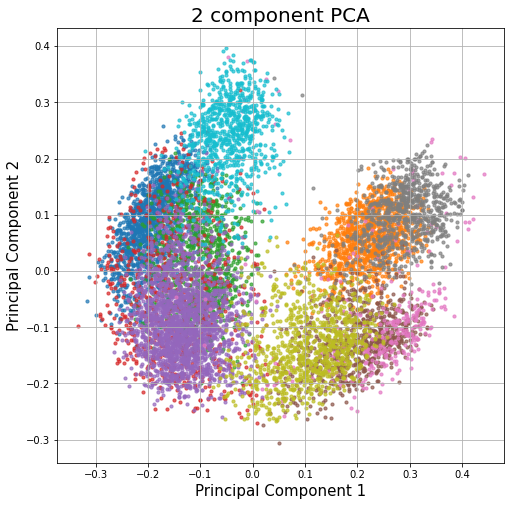

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
colors = np.random.rand(10)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
for i in range(10):
    plt.scatter(clusters[i]["PC1_2d"], clusters[i]["PC2_2d"], s = 10, alpha = 0.7)
ax.grid()

Пытаемся достать true_labels

In [ ]:
def unpickle(file):
  import pickle
  with open(file, 'rb') as fo:
   dict = pickle.load(fo, encoding='latin1')
  return dict

dic = unpickle('/content/drive/MyDrive/sirius/cifar-10-python/cifar-10-batches-py/test_batch')
print(dic['data'].shape)
print(len(dic['labels']))
dic['data'] = dic['data'].reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")

(10000, 3072)
10000


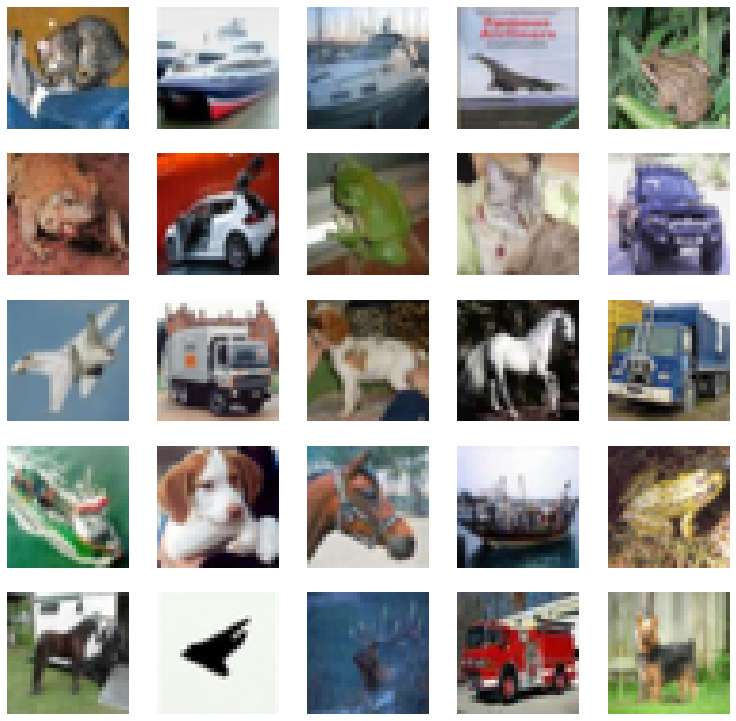

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from six.moves import cPickle 

f = open('/content/drive/MyDrive/Colab Notebooks/sirius/cifar-10-python/cifar-10-batches-py/test_batch', 'rb')
datadict = cPickle.load(f,encoding='latin1')
f.close()
X = datadict["data"] 
Y = datadict['labels']
X = X.reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("uint8")
Y = np.array(Y)

#Visualizing CIFAR 10
fig, axes1 = plt.subplots(5,5,figsize=(13,13))
i = 0
for j in range(5):
    for k in range(5):
        axes1[j][k].set_axis_off()
        axes1[j][k].imshow(X[i:i+1][0])
        i += 1


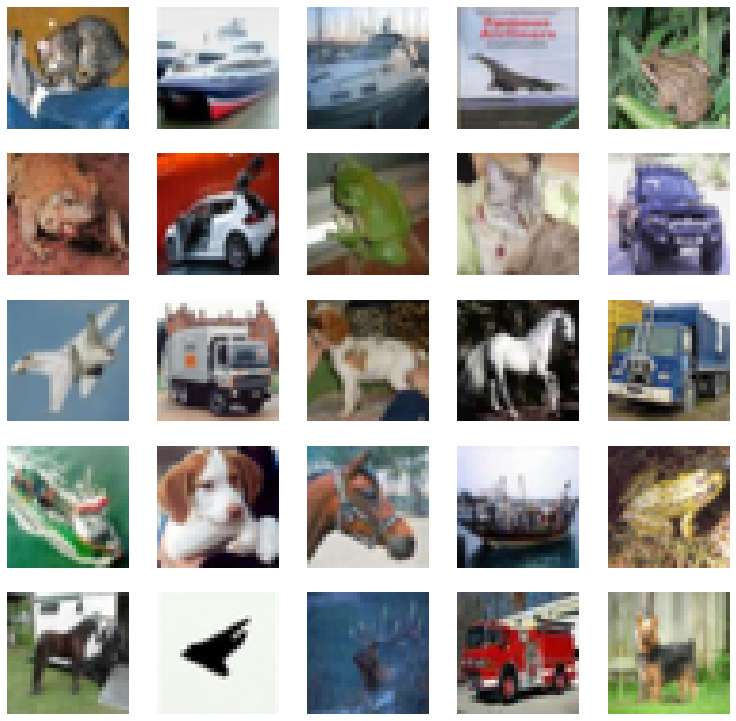

In [ ]:

f = np.load('/content/drive/MyDrive/Colab Notebooks/sirius/c10_test_pictures.npy')

#Visualizing CIFAR 10
fig, axes1 = plt.subplots(5,5,figsize=(13,13))
i = 0
for j in range(5):
    for k in range(5):
        axes1[j][k].set_axis_off()
        axes1[j][k].imshow(f[i:i+1][0])
        i += 1

In [ ]:
true_labels = Y

In [ ]:
sklearn.metrics.adjusted_rand_score(clusters_kmeans, Y)

0.5842831131523799